<a href="https://colab.research.google.com/github/ozzmanmuhammad/Pathology-images-preprocessing/blob/main/Pathology_Images_preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

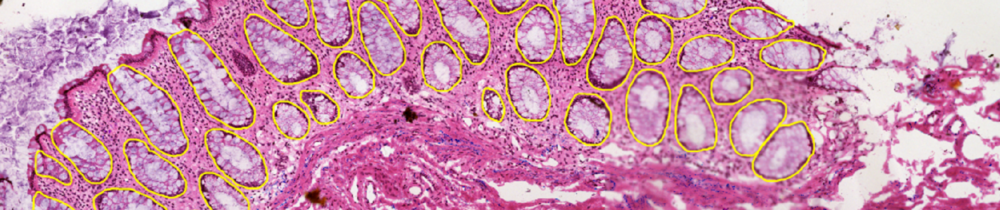

## 0.0 Introduction

This notebook contains the code to preprocess and generate tiles from `tiff images and annotation masks` for the deep learning.

## 1.0 Downloading the Dataset

In [1]:
!wget https://raw.githubusercontent.com/ozzmanmuhammad/Extras/main/DL_Extras/dataset_downloader.py

--2022-07-27 08:39:19--  https://raw.githubusercontent.com/ozzmanmuhammad/Extras/main/DL_Extras/dataset_downloader.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1058 (1.0K) [text/plain]
Saving to: ‘dataset_downloader.py’

dataset_downloader. 100%[===================>]   1.03K  --.-KB/s    in 0s      

2022-07-27 08:39:19 (58.1 MB/s) - ‘dataset_downloader.py’ saved [1058/1058]



In [8]:
from dataset_downloader import Download_Kaggle_Dataset

In [10]:
Download_Kaggle_Dataset('hubmap-organ-segmentation', '/content/hubmap-organ-segmentation')

## 2.0 Importing libraries & dependencies

In [4]:
!pip install tensorflow-addons
!pip install tensorflow-io
!pip install pandarallel

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 7.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 25.9 MB 1.2 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for pandarallel: filename=pandarallel-1.6.1-py3-none-any.whl size=16265 sha256=848fdccecbedbf364d2f73ca5b1c8469a14eb48ed98f7f03a008d60571be7537
  Stored in directory: /root/.cache/pip/wheels/e8/81/8f/29aafd7d671a4e9db4e976d71728870173f0b3f48ccba0bc32
Successfully built pandarallel


In [5]:
print("\n... IMPORTS STARTING ...\n")

print("\n\tVERSION INFORMATION")
# Machine Learning and Data Science Imports
import tensorflow as tf; print(f"\t\t– TENSORFLOW VERSION: {tf.__version__}");
import tensorflow_hub as tfhub; print(f"\t\t– TENSORFLOW HUB VERSION: {tfhub.__version__}");

import tensorflow_addons as tfa; print(f"\t\t– TENSORFLOW ADDONS VERSION: {tfa.__version__}");

import tensorflow_io as tfio; print(f"\t\t– TENSORFLOW I/O VERSION: {tfio.__version__}");
import pandas as pd; pd.options.mode.chained_assignment = None;
import numpy as np; print(f"\t\t– NUMPY VERSION: {np.__version__}");
import sklearn; print(f"\t\t– SKLEARN VERSION: {sklearn.__version__}");
from sklearn.preprocessing import RobustScaler, PolynomialFeatures
from pandarallel import pandarallel; pandarallel.initialize();
from sklearn.model_selection import GroupKFold, StratifiedKFold
from scipy.spatial import cKDTree
import tifffile as tiff

# # RAPIDS
# import cudf, cupy, cuml
# from cuml.neighbors import NearestNeighbors
# from cuml.manifold import TSNE, UMAP

# Built In Imports
from collections import Counter
from datetime import datetime
from glob import glob
import warnings
import requests
import hashlib
import imageio
import IPython
import sklearn
import urllib
import zipfile
import pickle
import random
import shutil
import string
import json
import math
import time
import gzip
import ast
import sys
import io
import os
import gc
import re

# Visualization Imports
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
import matplotlib.patches as patches
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm; tqdm.pandas();
import plotly.express as px
import seaborn as sns
from PIL import Image, ImageEnhance
import matplotlib; print(f"\t\t– MATPLOTLIB VERSION: {matplotlib.__version__}");
from matplotlib import animation, rc; rc('animation', html='jshtml')
import plotly
import PIL
import cv2

import plotly.io as pio
print(pio.renderers)

def seed_it_all(seed=7):
    """ Attempt to be Reproducible """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

    
print("\n\n... IMPORTS COMPLETE ...\n")


... IMPORTS STARTING ...


	VERSION INFORMATION
		– TENSORFLOW VERSION: 2.8.2
		– TENSORFLOW HUB VERSION: 0.12.0
		– TENSORFLOW ADDONS VERSION: 0.17.1
		– TENSORFLOW I/O VERSION: 0.26.0
		– NUMPY VERSION: 1.21.6
		– SKLEARN VERSION: 1.0.2
INFO: Pandarallel will run on 1 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.
		– MATPLOTLIB VERSION: 3.2.2
Renderers configuration
-----------------------
    Default renderer: 'colab'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']



... IMPORTS COMPLETE ...



## 3.0 Setup and EDA

In [6]:
print("\n... DATA ACCESS SETUP STARTED ...\n")

# Local path to training and validation images
DATA_DIR = "/content/hubmap-organ-segmentation"
print(f"\n... DATA DIRECTORY PATH IS:\n\t--> {DATA_DIR}")

print(f"\n... IMMEDIATE CONTENTS OF DATA DIRECTORY IS:")
for file in tf.io.gfile.glob(os.path.join(DATA_DIR, "*")): print(f"\t--> {file}")

print("\n\n... DATA ACCESS SETUP COMPLETED ...\n")


... DATA ACCESS SETUP STARTED ...


... DATA DIRECTORY PATH IS:
	--> /content/hubmap-organ-segmentation

... IMMEDIATE CONTENTS OF DATA DIRECTORY IS:


... DATA ACCESS SETUP COMPLETED ...



### 3.0.1 EDA

In [11]:
# Open the training dataframe and display the initial dataframe
TRAIN_IMAGES_DIR = os.path.join(DATA_DIR, "train_images")
TRAIN_LABELS_DIR = os.path.join(DATA_DIR, "train_annotations")

# Get all training images
all_train_images = glob(os.path.join(TRAIN_IMAGES_DIR, "*.tiff"), recursive=True)
all_train_labels = glob(os.path.join(TRAIN_LABELS_DIR, "*.json"), recursive=True)

# Training images csv
TRAIN_CSV = os.path.join(DATA_DIR, "train.csv")
train_df = pd.read_csv(TRAIN_CSV)

train_df.head()

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,37.0,Male
1,10274,prostate,HPA,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,76.0,Male
2,10392,spleen,HPA,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,82.0,Male
3,10488,lung,HPA,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,78.0,Male
4,10610,spleen,HPA,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,21.0,Female


In [12]:
# Open the test dataframe and display the initial dataframe
TEST_IMAGES_DIR = os.path.join(DATA_DIR, "test_images")

# Get all testing images if there are any
all_test_images = glob(os.path.join(TEST_IMAGES_DIR, "*.tiff"), recursive=True)

TEST_CSV = os.path.join(DATA_DIR, "test.csv")
test_df = pd.read_csv(TEST_CSV)

test_df.head()

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness
0,10078,spleen,Hubmap,2023,2023,0.4945,4


In [13]:

SS_CSV   = os.path.join(DATA_DIR, "sample_submission.csv")
ss_df = pd.read_csv(SS_CSV)


In [14]:
def rgb2hex(rgb_tuple):
    r,g,b = rgb_tuple
    def clamp(x): 
        return max(0, min(x, 255))
    return "#{0:02x}{1:02x}{2:02x}".format(clamp(r), clamp(g), clamp(b))

In [15]:
ORGANS = sorted(list(train_df.organ.unique()))
_COLOURS = [(230, 0, 73), (11, 180, 255), (80, 233, 145), (230, 216, 0), (155, 25, 245)]
O2C_MAP = {_o:_c for _o,_c in zip(ORGANS, _COLOURS)}
O2C_HEX_MAP = {_o:rgb2hex(_c) for _o,_c in O2C_MAP.items()}

In [16]:
sex_2_int = {"Male":0, "Female":1}
int_2_sex = {v:k for k,v in sex_2_int.items()}
age_divisor = 100.0

train_df["sex"] = train_df["sex"].map(sex_2_int)
train_df["age"] = train_df["age"]/age_divisor

In [17]:
train_img_map = {int(x[:-5].rsplit("/", 1)[-1]):x for x in all_train_images}
train_lbl_map = {int(x[:-5].rsplit("/", 1)[-1]):x for x in all_train_labels}
test_img_map = {int(x[:-5].rsplit("/", 1)[-1]):x for x in all_test_images}

In [18]:
train_df.insert(3, "img_path", train_df["id"].map(train_img_map))
train_df.insert(4, "lbl_path", train_df["id"].map(train_lbl_map))
test_df.insert(3, "img_path", test_df["id"].map(test_img_map))

In [19]:
train_df.head()

,id,organ,data_source,img_path,lbl_path,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,0.37,0
1,10274,prostate,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,0.76,0
2,10392,spleen,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,0.82,0
3,10488,lung,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,0.78,0
4,10610,spleen,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,0.21,1


In [20]:
print("\n... TRAINING DATAFRAME... \n")
display(train_df)

print("\n\n\n... TEST DATAFRAME... \n")
display(test_df)

print("\n\n\n... SUBMISSION DATAFRAME... \n")
display(ss_df)

print("\n... BASIC DATA SETUP FINISHED ...\n\n")


... TRAINING DATAFRAME... 



,id,organ,data_source,img_path,lbl_path,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,0.37,0
1,10274,prostate,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,0.76,0
2,10392,spleen,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,0.82,0
3,10488,lung,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,0.78,0
4,10610,spleen,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,0.21,1
...,...,...,...,...,...,...,...,...,...,...,...,...
346,9517,kidney,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,1611763 11 1614753 29 1617750 35 1620746 43 16...,0.61,0
347,9769,kidney,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3070,3070,0.4,4,4030400 28 4033466 34 4036526 48 4039594 54 40...,0.28,0
348,9777,largeintestine,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,538473 13 541468 22 544463 30 547461 35 550459...,0.84,0
349,9791,kidney,HPA,/content/hubmap-organ-segmentation/train_image...,/content/hubmap-organ-segmentation/train_annot...,3000,3000,0.4,4,334733 33 337729 43 340729 43 343725 51 346723...,0.28,0





... TEST DATAFRAME... 



,id,organ,data_source,img_path,img_height,img_width,pixel_size,tissue_thickness
0,10078,spleen,Hubmap,/content/hubmap-organ-segmentation/test_images...,2023,2023,0.4945,4





... SUBMISSION DATAFRAME... 



,id,rle
0,10078,12 34



... BASIC DATA SETUP FINISHED ...




## 4.0 Conversion functions

In [21]:
# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
# modified from: https://www.kaggle.com/inversion/run-length-decoding-quick-start
def rle_decode(mask_rle, shape, color=1):
    """ TBD
    
    Args:
        mask_rle (str): run-length as string formated (start length)
        shape (tuple of ints): (height,width) of array to return 
    
    Returns: 
        Mask (np.array)
            - 1 indicating mask
            - 0 indicating background

    """
    # Split the string by space, then convert it into a integer array
    s = np.array(mask_rle.split(), dtype=int)

    # Every even value is the start, every odd value is the "run" length
    starts = s[0::2] - 1
    lengths = s[1::2]
    ends = starts + lengths

    # The image image is actually flattened since RLE is a 1D "run"
    if len(shape)==3:
        h, w, d = shape
        img = np.zeros((h * w, d), dtype=np.float32)
    else:
        h, w = shape
        img = np.zeros((h * w,), dtype=np.float32)

    # The color here is actually just any integer you want!
    for lo, hi in zip(starts, ends):
        img[lo : hi] = color
        
    # Don't forget to change the image back to the original shape
    return img.reshape(shape).T

In [22]:
# https://www.kaggle.com/namgalielei/which-reshape-is-used-in-rle
def rle_decode_top_to_bottom_first(mask_rle, shape):
    """ TBD
    
    Args:
        mask_rle (str): run-length as string formated (start length)
        shape (tuple of ints): (height,width) of array to return 
    
    Returns:
        Mask (np.array)
            - 1 indicating mask
            - 0 indicating background

    """
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape((shape[1], shape[0]), order='F').T  # Reshape from top -> bottom first

In [23]:
# ref.: https://www.kaggle.com/stainsby/fast-tested-rle
def rle_encode(img):
    """ TBD
    
    Args:
        img (np.array): 
            - 1 indicating mask
            - 0 indicating background
    
    Returns: 
        run length as string formated
    """
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)


In [24]:
def flatten_l_o_l(nested_list):
    """ Flatten a list of lists """
    return [item for sublist in nested_list for item in sublist]

In [25]:
def load_json_to_dict(json_path):
    """ tbd """
    with open(json_path) as json_file:
        data = json.load(json_file)
    return data

In [26]:
def tf_decode_tiff(img_path, to_numpy=False, to_rgb=False):
    img = tf.io.read_file(img_path)
    img = tfio.experimental.image.decode_tiff(img)
    
    # Optionals
    if to_rgb: img = tfio.experimental.color.rgba_to_rgb(img)
    if to_numpy: img = img.numpy()
        
    return img

In [27]:
def rle_decode_tf(mask_rle, shape):
    """ TBD """
    
    shape = tf.convert_to_tensor(shape, tf.int64)
    size = tf.math.reduce_prod(shape)
    
    # Split string
    s = tf.strings.split(mask_rle)
    s = tf.strings.to_number(s, tf.int64)
    
    # Get starts and lengths
    starts = s[::2] - 1
    lens = s[1::2]
    
    # Make ones to be scattered
    total_ones = tf.reduce_sum(lens)
    ones = tf.ones([total_ones], tf.uint8)
    
    # Make scattering indices
    r = tf.range(total_ones)
    lens_cum = tf.math.cumsum(lens)
    s = tf.searchsorted(lens_cum, r, 'right')
    idx = r + tf.gather(starts - tf.pad(lens_cum[:-1], [(1, 0)]), s)
    
    # Scatter ones into flattened mask
    mask_flat = tf.scatter_nd(tf.expand_dims(idx, 1), ones, [size])
    
    # Reshape into mask
    return tf.transpose(tf.reshape(mask_flat, shape))

In [28]:
def _bytes_feature(value, is_list=False):
    """Returns a bytes_list from a string / byte."""
    if isinstance(value, type(tf.constant(0))):
        value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
    
    if not is_list:
        value = [value]
    
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=value))

def _float_feature(value, is_list=False):
    """Returns a float_list from a float / double."""
        
    if not is_list:
        value = [value]
        
    return tf.train.Feature(float_list=tf.train.FloatList(value=value))

def _int64_feature(value, is_list=False):
    """Returns an int64_list from a bool / enum / int / uint."""
        
    if not is_list:
        value = [value]
        
    return tf.train.Feature(int64_list=tf.train.Int64List(value=value))

In [29]:
def serialize_raw(image, mask, id_str):
    """
    Creates a tf.Example message ready to be written to a file from 4 features.

    Args:
        image (TBD): TBD
        mask (TBD): TBD
        id_str (str): TBD
    
    Returns:
        A tf.Example Message ready to be written to file
    """
    
    # Create a dictionary mapping the feature name to the 
    # tf.Example-compatible data type.
    feature = {
        "image"    : _bytes_feature(tf.io.encode_png(image), is_list=False),
        "mask"     : _bytes_feature(tf.io.encode_png(mask),  is_list=False),
        "id_str"   : _bytes_feature(id_str, is_list=False)
    }

    # Create a Features message using tf.train.Example.
    example_proto = tf.train.Example(features=tf.train.Features(feature=feature))
    return example_proto.SerializeToString()

### 4.0.1 Converting the dataset

This notebook will allow you to create 3 different types of datasets. The 3 different types of datasets are:

1. Tiled PNG Dataset [train|val]
2. Tiled TFRecord Dataset [train|val]
3. Stratified Splits For Tiled TFRecord 4. Dataset [train|val]
4. Stratified Splits For Tiled PNG Dataset [train|val]

#### Defining Parameters

In [31]:
STYLE = "png" # one of ["png"|"tfrec"]
TILED_OUTPUT_DIR = "/content/hubmap-organ-tiled-dataset"
TILE_SIZE = 512
STRIDE = 384 # if STRIDE==TILE_SIZE there will be no overlap between tiles
FULL_SIZE_RES = 0.4 # if 0.4 then no rescale on train data
DROP_EMPTY_TILES = True
UPSAMPLE=False # Whether or not to upsample under-represented classes
MIX_ORGANS = True # If True, create a single dataset with all organs shuffled, otherwise, create indiv. organ datasets

In [33]:
print("ORGAN DISTRIBUTION")
train_df.organ.value_counts()

ORGAN DISTRIBUTION


kidney            99
prostate          93
largeintestine    58
spleen            53
lung              48
Name: organ, dtype: int64

In [35]:
# CREATE TILED PNG DATASET

def tile_example(img_path, mask_rle, ex_id, organ, 
                 do_save=False, save_dir="/kaggle/working/tiled_dataset", 
                 tile_size=512, stride=None, discard_edge=True, edge_pad=(245, 245, 244),
                 full_img_size=3000, new_size_res=0.4, original_size_res=0.4):
    """
    
    Args:
        img_path (str):
            A string pointing to the .tiff file to be tiled
        mask_rle (str):
            This is a run-length encoding specifying the location of the respective organ FTUs. 
            RLEs are generally used to encode the location of foreground objects in segmentation. 
                - Instead of outputting a mask image, you give a list of start pixels and how many pixels 
                  after each of those starts is included in the mask. 
                - The encoding rule is pretty simple: 
                    -- Where the mask IS --> 1
                    -- Where the mask IS NOT --> 0
        ex_id (int):
            A unique identifier for a particular example
        organ (str):
            The respective organ for a given example indicating the FTU that will be masked by the RLE string.
                - FTUs in the organs presented in this competition are:
                    1. glomeruli in the kidney
                    2. crypt in the large intestine
                    3. alveolus in the lung
                    4. glandular acinus in the prostate
                    5. white pulp in the spleen
        do_save (bool, optional):
            Whether or not we want to save the tiles to disk or return them as a list of arrays
        save_dir (str, optional):
            A string pointing to the root directory to save the respective files IF the `do_save` argument is `True` 
        tile_size (int, optional):
            An integer representing the square image size that the image will be tiled with
                i.e. 3000x3000 image with 300x300 tiles (assume `stride=300`) will yield 100 tiles.
        stride (int, optional):
            An integer representing the stride between adjoining tiles. 
            When stride=tile_size there will be no overlap between adjoining tiles.
                i.e. 3000x3000 image with 300x300 tiles (assume `stride=300`) will yield 100 tiles.
            When stride<tile_size there will be some overlap between adjoining tiles
                i.e. 3000x3000 image with 300x300 tiles (assume `stride=150`) will yield 324 tiles.
            When stride>tile_size there will be some parts of the image missing between adjoining tiles
                i.e. 3000x3000 image with 300x300 tiles (assume `stride=450`) will yield 36 tiles.
        discard_edge (bool, optional):
            A bool indicating whether or not to discard or pad edges that do not "fill up" a whole tile
                - If `discard_edge` is `True` we simply discard incomplete tiles at the edges
                - If `discard_edge` is `False` we pad incomplete tiles at the edges to make them complete
        edge_pad (tuple of ints, optional):
            The RGB value to use for padding the image (0 will be used for the mask)
        full_img_size (int, optional):
            An integer indicating the original full-scale pixel size of the image to be tiled
        new_size_res (int, optional):
            The resolution in um per pixel for the desired tiles (probably 0.4 to match HPA data)
        original_size_res (int, optional):
            The resolution in um per pixel for the original image (0.4 for HPA, other organ dependant res for HuBMAP)
        
    Returns:
           ––– do_save=True –––
        1. Returns a partial path that specifies the root str to access
           the saved tile images and masks (saved as png) and saves all
           of the tiled images to disk in the specified folder.
           
           ––– do_save=False –––
        2. Returns the tiled image and mask as per the specified arguments
    """
    # Create directory 
    if do_save and not os.path.isdir(save_dir): os.makedirs(save_dir, exist_ok=True)
    
    # Set stride to tile size if not provided
    if stride is None: stride=tile_size
    
    # Open image and mask from file
    img = tiff.imread(img_path)
    mask = np.array(rle_decode_tf(mask_rle, (full_img_size,full_img_size)), dtype=np.uint8)
    
    # Update resolution and image size accordingly
    if new_size_res!=original_size_res:
        resize_to = full_img_size = full_img_size*(original_size_res/new_size_res)
        img = cv2.resize(img, (resize_to, resize_to))
        mask = cv2.resize(mask, (resize_to, resize_to), interpolation=cv2.INTER_NEAREST)
    
    # Loop over image
    img_crops, mask_crops = [], []
    for x in range(tile_size, full_img_size+stride, stride):
        for y in range(tile_size, full_img_size+stride, stride):
            x1, y1 = x-tile_size, y-tile_size
            x2, y2 = min(x, full_img_size), min(y, full_img_size)
            _img_crop = img[x1:x2, y1:y2]
            _mask_crop = mask[x1:x2, y1:y2]
            
            if discard_edge and _img_crop.shape!=(tile_size, tile_size, 3): continue
            
            if do_save:
                cv2.imwrite(os.path.join(save_dir, f"image_{ex_id}_{organ}__s_{STRIDE}__t_{TILE_SIZE}__{x1}_{y1}.png"), _img_crop[..., ::-1])
                cv2.imwrite(os.path.join(save_dir, f"mask_{ex_id}_{organ}__s_{STRIDE}__t_{TILE_SIZE}__{x1}_{y1}.png"), _mask_crop)
            else:
                img_crops.append(_img_crop)
                mask_crops.append(_mask_crop)
    if not do_save:
        return img_crops, mask_crops  
    else:
        return os.path.join(save_dir, f"image_{ex_id}_{organ}__s_{STRIDE}__t_{TILE_SIZE}")


In [37]:
DEMO_IDX = 10
train_df.iloc[DEMO_IDX].organ

'prostate'

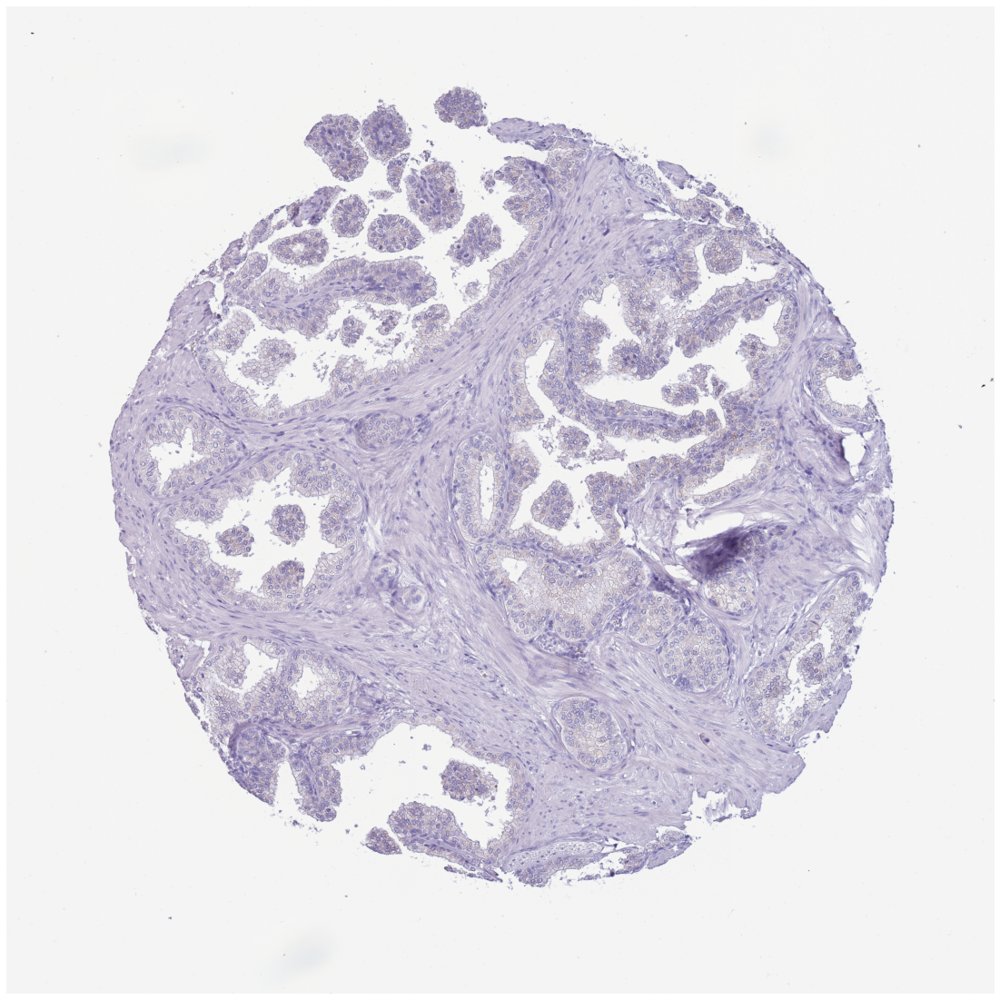

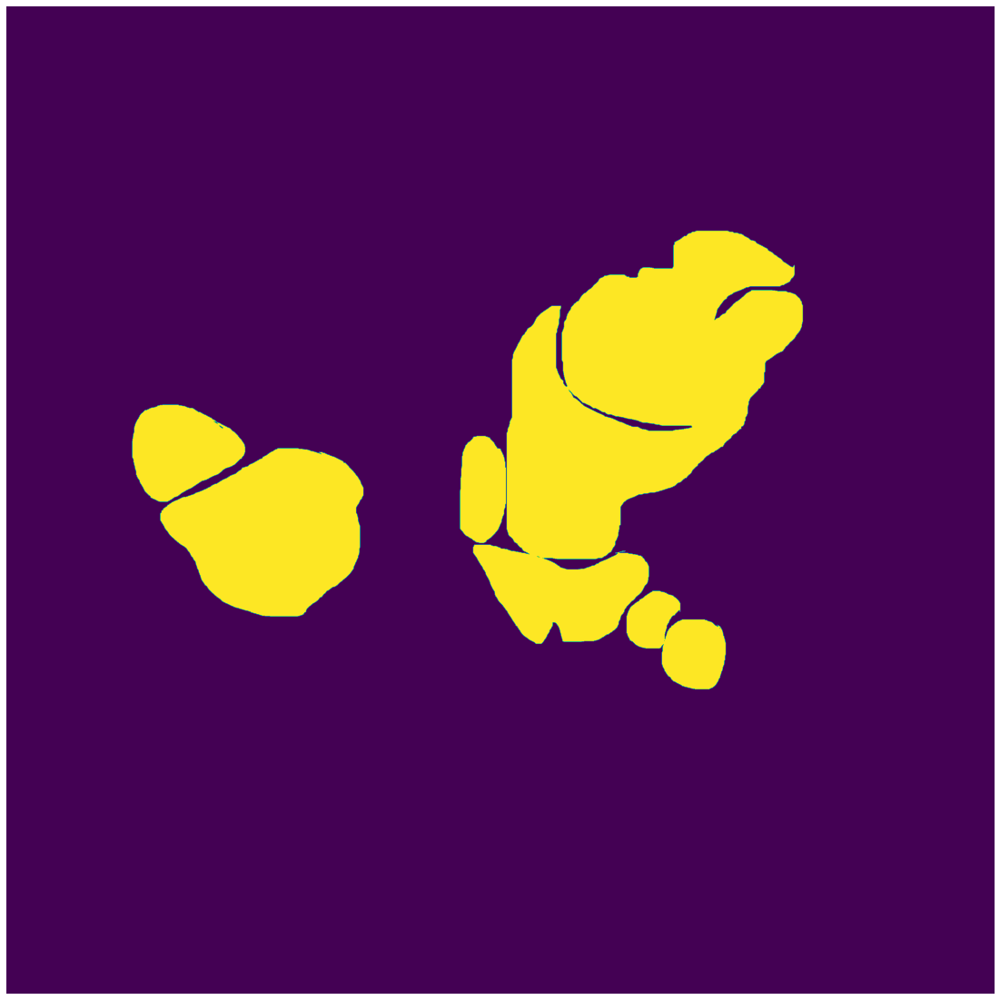

0it [00:00, ?it/s]

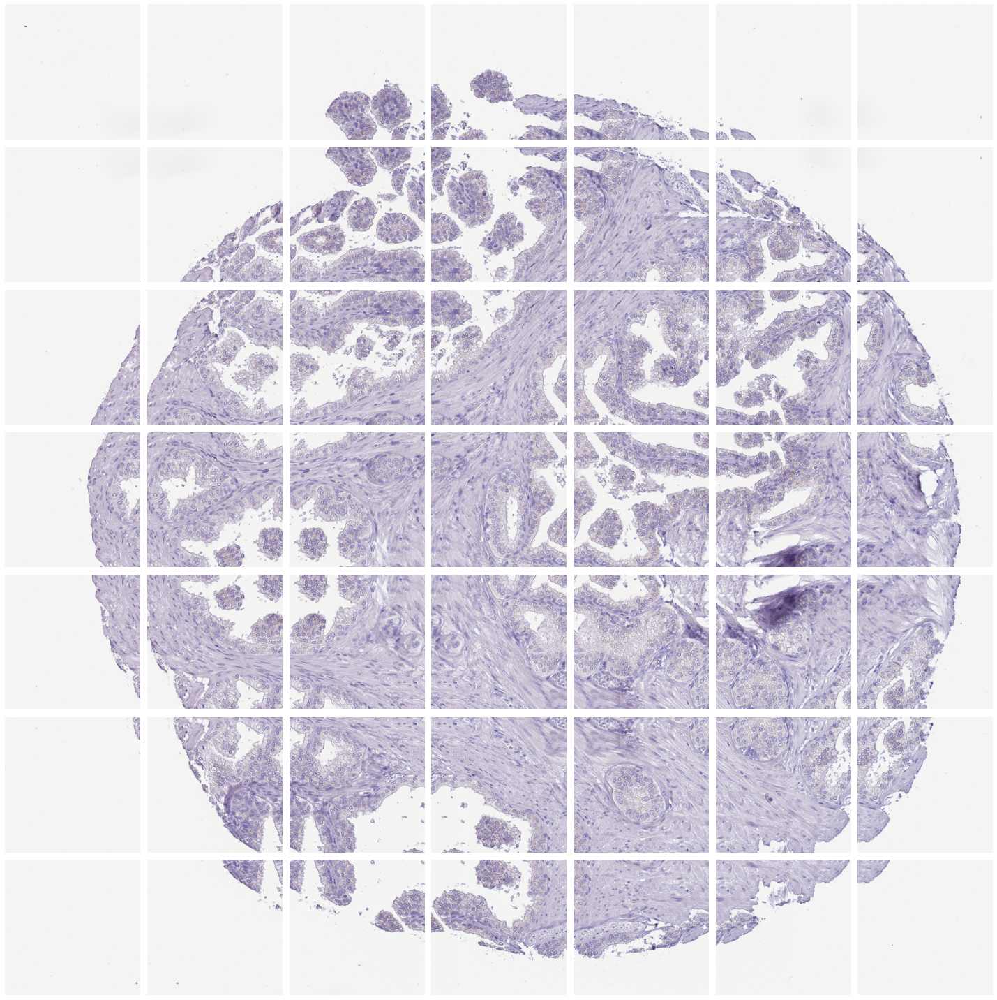

0it [00:00, ?it/s]

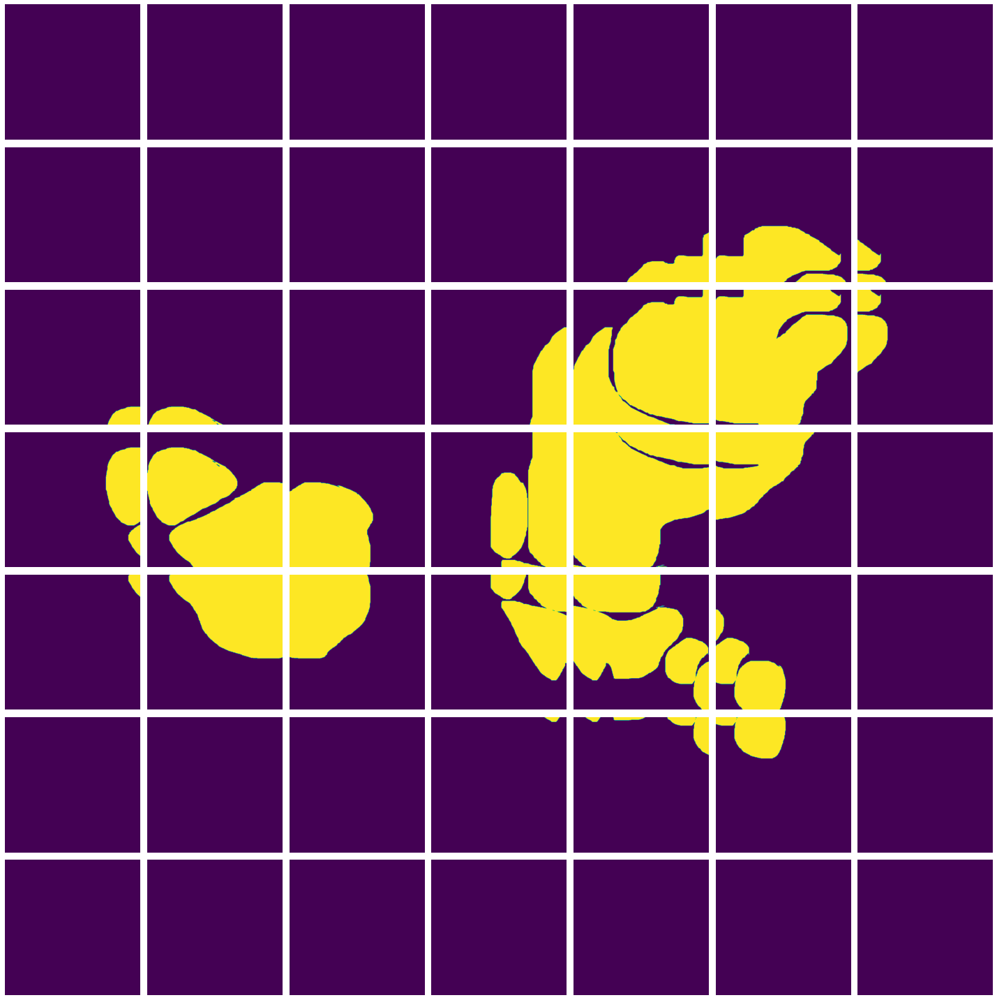

In [36]:
img_crops, mask_crops = tile_example(train_df.iloc[DEMO_IDX].img_path, 
                                     train_df.iloc[DEMO_IDX].rle, 
                                     train_df.iloc[DEMO_IDX].id, 
                                     train_df.iloc[DEMO_IDX].organ,
                                     tile_size=TILE_SIZE, stride=STRIDE)

plt.figure(figsize=(20,20))
plt.imshow(cv2.imread(train_df.iloc[DEMO_IDX].img_path)[..., ::-1])
plt.axis(False)
plt.show()

plt.figure(figsize=(20,20))
plt.imshow(rle_decode_tf(train_df.iloc[DEMO_IDX].rle, (train_df.iloc[DEMO_IDX].img_width,train_df.iloc[DEMO_IDX].img_height)))
plt.axis(False)
plt.show()

plt.figure(figsize=(20,20))
for i, img_crop in tqdm(enumerate(img_crops)):
    plt.subplot(int(len(img_crops)**0.5), int(len(img_crops)**0.5),i+1)
    plt.imshow(img_crop)
    plt.axis(False)
plt.tight_layout()
plt.show()

plt.figure(figsize=(20,20))
for i, mask_crop in tqdm(enumerate(mask_crops)):
    plt.subplot(int(len(mask_crops)**0.5), int(len(mask_crops)**0.5),i+1)
    plt.imshow(mask_crop)
    plt.axis(False)

plt.tight_layout()
plt.show()


In [38]:
def pandas_tile_fn(row):
    """ 
    Create wrapper function to allow us to return root path and leverage
    `.progress_apply|.parallel_apply` if we so wish
    
    This will take 5-30 minutes depending on:
        - Settings related to tile-size and stride
        - Computer hardware
        - Whether you leverage multiprocessing
    """
    return tile_example(row.img_path, row.rle, row.id, row.organ, tile_size=TILE_SIZE, stride=STRIDE, full_img_size=row.img_width, do_save=True, save_dir=TILED_OUTPUT_DIR)

train_df["tile_image_root_path"] = train_df.progress_apply(pandas_tile_fn, axis=1)
train_df["tile_mask_root_path"] = train_df["tile_image_root_path"].str.replace("/image_", "/mask_")

  0%|          | 0/351 [00:00<?, ?it/s]

In [39]:
def get_sorted_tiles(root_path):
    return sorted(glob(root_path+"*.png"), key=lambda x: [int(_x) for _x in x[:-4].rsplit("_", 2)[1:]])

In [40]:
demo_img_tiles_after_save  = get_sorted_tiles(train_df.iloc[DEMO_IDX].tile_image_root_path)
demo_mask_tiles_after_save = get_sorted_tiles(train_df.iloc[DEMO_IDX].tile_mask_root_path)

0it [00:00, ?it/s]

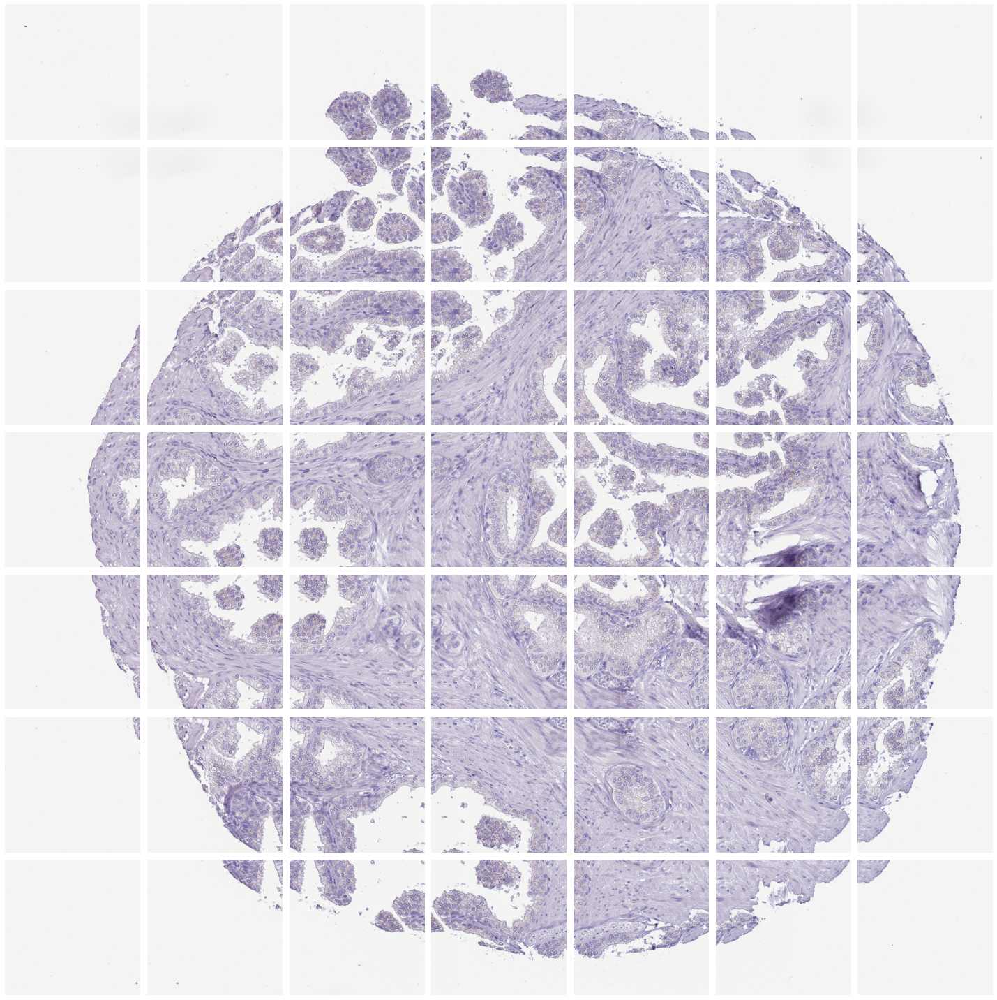

0it [00:00, ?it/s]

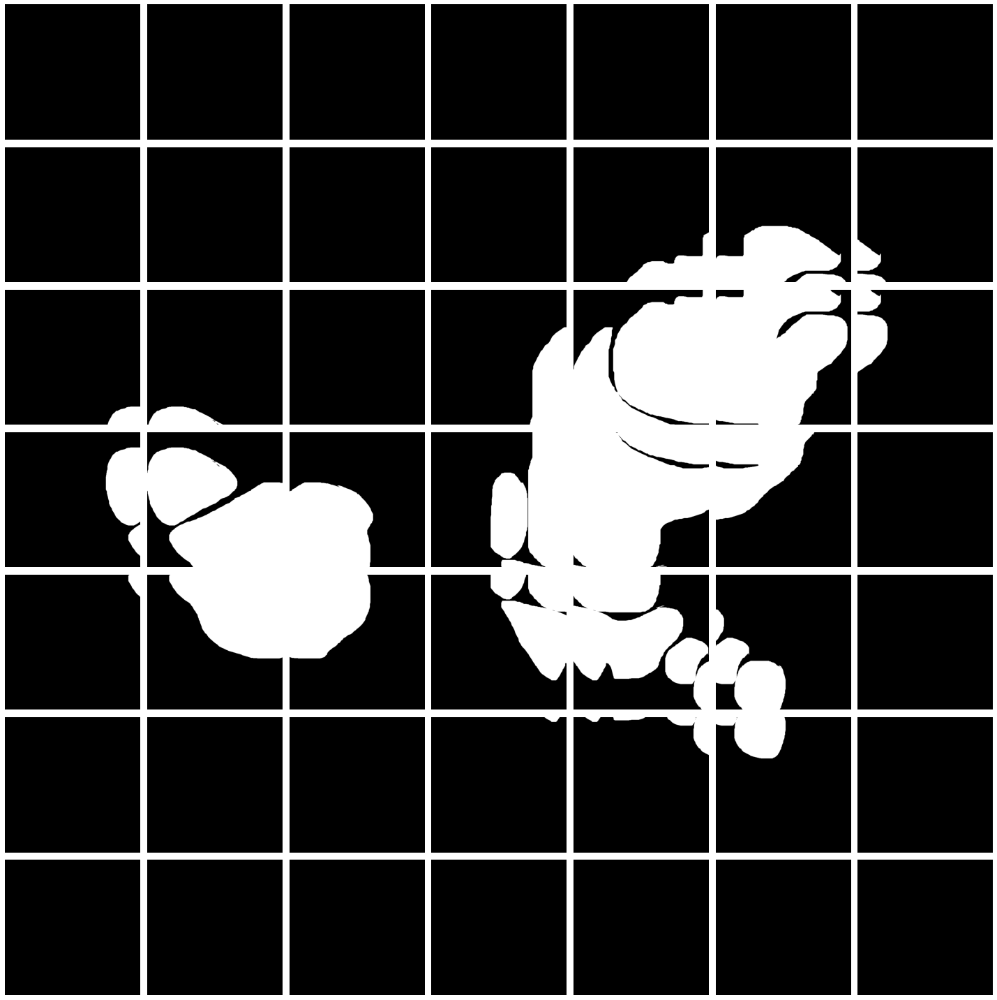

In [41]:
plt.figure(figsize=(20,20))
for i, img_crop in tqdm(enumerate(demo_img_tiles_after_save)):
    plt.subplot(int(len(demo_img_tiles_after_save)**0.5), int(len(demo_img_tiles_after_save)**0.5),i+1)
    plt.imshow(cv2.imread(img_crop)[..., ::-1])
    plt.axis(False)
plt.tight_layout()
plt.show()

plt.figure(figsize=(20,20))
for i, mask_crop in tqdm(enumerate(demo_mask_tiles_after_save)):
    plt.subplot(int(len(demo_mask_tiles_after_save)**0.5), int(len(demo_mask_tiles_after_save)**0.5),i+1)
    plt.imshow(cv2.imread(mask_crop).astype(np.float32))
    plt.axis(False)
plt.tight_layout()
plt.show()

In [42]:
def sort_all_tiles(file_list):
    """ sorts by id-->tile_h-->tile_w """
    return sorted(file_list, key=lambda x: [int(x.rsplit("_", 11)[1]),]+[int(_x) for _x in x[:-4].rsplit("_", 2)[1:]])

In [61]:
def get_meta(row):
    """ Get information from file path and mask area """
    print(row)
    split_meta = row.img_path[:-4].rsplit("_")[1:]
    print(split_meta)
    row["id"] = int(split_meta[0])
    row["organ"] = split_meta[1]
    row["stride"] = int(split_meta[4])
    row["tile_size"] = int(split_meta[7])
    row["tl_x"] = int(split_meta[10])
    row["tl_y"] = int(split_meta[9])
    row["mask_area"] = int(cv2.imread(row.mask_path)[..., 0].sum())
    return row

In [63]:
tile_train_df = pd.DataFrame({
    "img_path":sort_all_tiles(glob(os.path.join(TILED_OUTPUT_DIR, "image*"))),
    "mask_path":sort_all_tiles(glob(os.path.join(TILED_OUTPUT_DIR, "mask*")))
})

In [ ]:
tile_train_df = tile_train_df.progress_apply(get_meta, axis=1)

In [66]:
if DROP_EMPTY_TILES:  tile_train_df=tile_train_df[tile_train_df.mask_area>0].reset_index(drop=True)

In [73]:
display(tile_train_df)

,img_path,mask_path,id,organ,stride,tile_size,tl_x,tl_y,mask_area
0,/content/hubmap-organ-tiled-dataset/image_62_k...,/content/hubmap-organ-tiled-dataset/mask_62_ki...,62,kidney,384,512,2304,768,785
1,/content/hubmap-organ-tiled-dataset/image_62_k...,/content/hubmap-organ-tiled-dataset/mask_62_ki...,62,kidney,384,512,2304,1152,40300
2,/content/hubmap-organ-tiled-dataset/image_62_k...,/content/hubmap-organ-tiled-dataset/mask_62_ki...,62,kidney,384,512,1152,1536,5680
3,/content/hubmap-organ-tiled-dataset/image_62_k...,/content/hubmap-organ-tiled-dataset/mask_62_ki...,62,kidney,384,512,1536,1536,3615
4,/content/hubmap-organ-tiled-dataset/image_62_k...,/content/hubmap-organ-tiled-dataset/mask_62_ki...,62,kidney,384,512,2304,1536,15237
...,...,...,...,...,...,...,...,...,...
7550,/content/hubmap-organ-tiled-dataset/image_3274...,/content/hubmap-organ-tiled-dataset/mask_32741...,32741,prostate,384,512,0,2304,187
7551,/content/hubmap-organ-tiled-dataset/image_3274...,/content/hubmap-organ-tiled-dataset/mask_32741...,32741,prostate,384,512,384,2304,85350
7552,/content/hubmap-organ-tiled-dataset/image_3274...,/content/hubmap-organ-tiled-dataset/mask_32741...,32741,prostate,384,512,768,2304,191512
7553,/content/hubmap-organ-tiled-dataset/image_3274...,/content/hubmap-organ-tiled-dataset/mask_32741...,32741,prostate,384,512,1152,2304,152136


In [68]:
fig = px.histogram(tile_train_df[tile_train_df.mask_area>0], "mask_area", color_discrete_map=O2C_HEX_MAP, color="organ", title="<b>Mask Area</b>")
fig.show()

## 5.0 Final Confirmation

Final confirmation by overlaying org and tiled images with there masks.

### 5.0.1 Plot Orginal Images and RLE

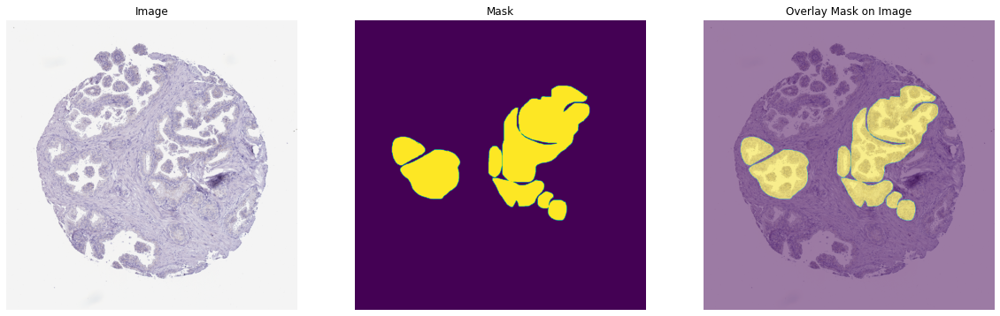

In [72]:
# Read Orginal Images and RLE
image = cv2.imread(train_df.iloc[DEMO_IDX].img_path)[..., ::-1]
mask = rle_decode_tf(train_df.iloc[DEMO_IDX].rle, (train_df.iloc[DEMO_IDX].img_width,train_df.iloc[DEMO_IDX].img_height))

# Overlay Mask on Image
fig, ax = plt.subplots(1, 3, figsize=(20,20))
ax[0].imshow(image)
ax[0].set_title('Image')
ax[0].axis(False)

ax[1].imshow(mask) 
ax[1].axis(False)
ax[1].set_title('Mask')

ax[2].imshow(image)
ax[2].axis(False)
ax[2].imshow(mask, alpha=0.5)
ax[2].set_title('Overlay Mask on Image')
plt.show()

### 5.0.2 Plot tiled Images and there Masks

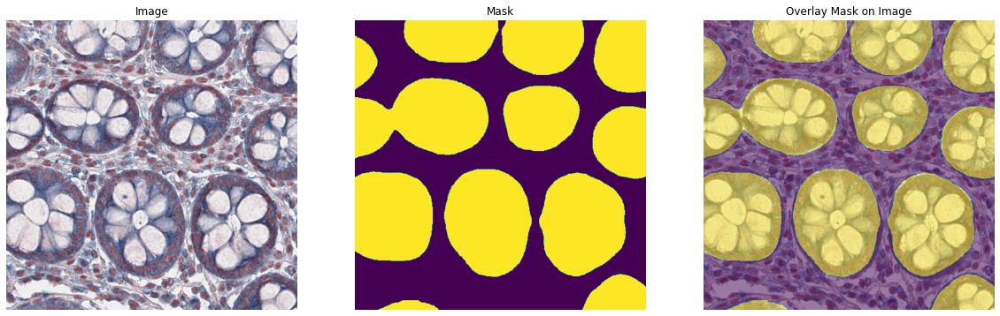

In [90]:
# Read Orginal Images and RLE
rand_img = np.random.choice(tile_train_df.img_path.to_numpy())
image = cv2.imread(rand_img)
mask = cv2.imread(rand_img.replace('image', 'mask'), 0)

# Overlay Mask on Image
fig, ax = plt.subplots(1, 3, figsize=(20,20))
ax[0].imshow(image)
ax[0].set_title('Image')
ax[0].axis(False)

ax[1].imshow(mask) 
ax[1].axis(False)
ax[1].set_title('Mask')

ax[2].imshow(image)
ax[2].axis(False)
ax[2].imshow(mask, alpha=0.5)
ax[2].set_title('Overlay Mask on Image')
plt.show()

## 6.0: Saving...

Saving the tiled images and there respective masks into `Images` and `Masks` folder

In [119]:
def move_files(img_path, mask_path):

  shutil.copy2(img_path, "/content/dataset/images/"+ img_path.split('/')[-1])
  shutil.copy2(mask_path, "/content/dataset/masks/"+ mask_path.split('/')[-1])

In [108]:
from joblib import Parallel, delayed

In [120]:
_= Parallel(n_jobs=3)(
        delayed(move_files)(img[1], mask[1]) for img, mask in tqdm(zip(tile_train_df.img_path.items(),
                                                                                     tile_train_df.mask_path.items()))
)

0it [00:00, ?it/s]

In [121]:
len(os.listdir('/content/dataset/images/')), len(os.listdir('/content/dataset/masks/'))

(7555, 7555)

In [ ]:
!zip -r /content/hubmap-organ-dataset.zip /content/dataset

In [123]:
#too slow.
from google.colab import files
files.download('/content/hubmap-organ-dataset.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
! cat /proc/cpuinfo

In [124]:
os.mkdir('/content/drive/MyDrive/hubmap-organ-dataset')

In [125]:
shutil.copy2('/content/hubmap-organ-dataset.zip', '/content/drive/MyDrive/hubmap-organ-dataset')

'/content/drive/MyDrive/hubmap-organ-dataset/hubmap-organ-dataset.zip'